In [ ]:
%%capture
!test -d ./TCC-EEG && rm -r TCC-EEG
%cd /content/
!git clone https://github.com/TheoMoutakanni/TCC-EEG.git
%cd /content/TCC-EEG/
!pip install -U https://api.github.com/repos/braindecode/braindecode/zipball/master

In [35]:
%load_ext autoreload 
%autoreload 1
%aimport models, utils
from importlib import reload
reload(utils.plot)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<module 'utils.plot' from '/home/theo/Documents/TCC-EEG/utils/plot.py'>

In [36]:
from braindecode.util import set_random_seeds
from braindecode.datasets.base import BaseConcatDataset
import matplotlib.pyplot as plt
import numpy as np
import pickle
from skorch.callbacks import EpochScoring, ProgressBar
from skorch.helper import predefined_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm.notebook import tqdm

import torch

from utils.datasets import get_sleep_physionet, split_dataset, list_of_train_sets
from utils.skorch import EEGTransformer
from utils.plot import (sleep_cmap, rand_cmap, plot_embeddings, get_ages, get_sleep_stages, get_subjects)
from models.contrastive import ContrastiveModule, EncoderNet, ClassifierNet, train_and_test

In [5]:
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# Contrastive Task Training

## Dataset Creation

In [2]:
%%capture
# full dataset, to get a small one, use: get_sleep_physionet(range(10))
windows_dataset, info = get_sleep_physionet()

In [6]:
self_train_set, self_valid_set, full_train_set, valid_set, test_set, subjects_dic = split_dataset(windows_dataset)
print(len(self_train_set), len(self_valid_set), len(full_train_set), len(valid_set), len(test_set))

59428 9820 69248 9880 9047


In [7]:
from utils.datasets import TimeContrastiveDataset
subjects = list(windows_dataset.split('subject').keys())
self_train_sets = list_of_train_sets(subjects_dic['self_train_subjects'], self_train_set, TimeContrastiveDataset, {'delta_index_positive':5, 'delta_index_negative':20})

## Encoder Training

In [17]:
n_channels = 2
p_dropout = 0.2

lr = 5e-4
batch_size = 100
max_nb_epochs = 200
early_stopping_patience = 10

networks, skorch_nets, nb_subjects = [], [], []

for self_train_set in self_train_sets[:100:5]:
    encoder = EncoderNet(feat_per_layer=[32, 64, 128], n_channels=n_channels, p_dropout=p_dropout, apply_batch_norm=False)
    network = ContrastiveModule(encoder)
    nb_subject = len(self_train_set.split('subject'))
    nb_subjects.append(nb_subject)
    if os.path.isfile('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject)):
        print('Loading: ', nb_subject)
        #network.load_state_dict(torch.load('./experiences/nb_patients/contrastive_network_{}.pt'.format(nb_subject)))
        with open('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject), 'rb') as f:
            skorch_net = pickle.load(f)
        network = skorch_net.module_
    else:
        print('Training: ', nb_subject)
        skorch_net = network.train_(
            self_train_set, self_valid_set, lr=lr, batch_size=batch_size,
            max_nb_epochs=max_nb_epochs, early_stopping_patience=early_stopping_patience)
        torch.save(network.state_dict(), './experiences/nb_patients/contrastive_network_{}.pt'.format(nb_subject))
        with open('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject), 'wb') as f:
            pickle.dump(skorch_net, f)
    networks.append(network)
    skorch_nets.append(skorch_net)

Training:  1


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss     dur
-------  ---------------  ------------  ---------------  ------------  ------
      1           0.4840        0.6989           0.5572        0.6869  2.5075


      2           0.5422        0.6778           0.5652        0.6794  2.4483


      3           0.5811        0.6762           0.5796        0.6730  2.4282


      4           0.5853        0.6667           0.6220        0.6679  2.4106


      5           0.6140        0.6442           0.6480        0.6481  2.4016


      6           0.5889        0.6368           0.6508        0.6333  2.4085


      7           0.6154        0.6320           0.6568        0.6258  2.4419


      8           0.6379        0.6300           0.6941        0.6294  2.4234


      9           0.6442        0.6237           0.6912        0.5999  2.4411


     10           0.6696        0.6000           0.7168        0.5858  2.4473


     11           0.6637        0.5961           0.7113        0.5751  2.4568


     12           0.6884        0.5898           0.7322        0.5647  2.4522


     13           0.6974        0.5712           0.7422        0.5588  2.4545


     14           0.7376        0.5383           0.7391        0.5661  2.4677


     15           0.7228        0.5336           0.7434        0.5394  2.4695


     16           0.7297        0.5506           0.7324        0.5465  2.4927


     17           0.7183        0.5474           0.7101        0.5373  2.4568


     18           0.7269        0.5500           0.7462        0.5424  2.5211


     19           0.7379        0.5150           0.7603        0.5359  2.4899


     20           0.7475        0.5162           0.7480        0.5424  2.5068


     21           0.7157        0.5341           0.7478        0.5434  2.5087


     22           0.7330        0.5228           0.7456        0.5374  2.5505


     23           0.7503        0.4977           0.7446        0.5253  2.5475


     24           0.7700        0.4763           0.7463        0.5312  2.5281


     25           0.7684        0.5093           0.7544        0.5232  2.5263


     26           0.7690        0.4864           0.7441        0.5216  2.5233


     27           0.7593        0.4902           0.7448        0.5204  2.4817


     28           0.7423        0.5115           0.7577        0.5130  2.4965


     29           0.7744        0.4830           0.7517        0.5222  2.5536


     30           0.7648        0.4980           0.7388        0.5590  2.4903


     31           0.7813        0.4845           0.7416        0.5287  2.4986


     32           0.7751        0.4964           0.7508        0.5354  2.5079


     33           0.7779        0.4655           0.7505        0.5151  2.5434


     34           0.7722        0.4834           0.7642        0.5192  2.5170


     35           0.7870        0.4593           0.7501        0.5199  2.4994


     36           0.7865        0.4644           0.7543        0.5241  2.4747


     37           0.7649        0.4720           0.7449        0.5307  2.5357


     38           0.7792        0.4789           0.7607        0.5081  2.5396


     39           0.7788        0.4840           0.7427        0.5394  2.5307


     40           0.7992        0.4522           0.7547        0.5274  2.5667


     41           0.7797        0.4537           0.7512        0.5295  2.4908


     42           0.7880        0.4703           0.7519        0.5152  2.4865


     43           0.8006        0.4535           0.7597        0.5030  2.4883


     44           0.7955        0.4409           0.7610        0.4967  2.5373


     45           0.7907        0.4454           0.7569        0.5000  2.5304


     46           0.7880        0.4568           0.7508        0.5277  2.5424


     47           0.7908        0.4537           0.7484        0.5355  2.5874


     48           0.7976        0.4490           0.7508        0.5218  2.5709


     49           0.7723        0.4717           0.7599        0.4990  2.5803


     50           0.7948        0.4523           0.7511        0.5093  2.5326


     51           0.8082        0.4366           0.7545        0.5132  2.5776


     52           0.7982        0.4414           0.7534        0.5248  2.6007


     53           0.7834        0.4612           0.7377        0.5212  2.5429


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  6


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss     dur
-------  ---------------  ------------  ---------------  ------------  ------
      1           0.6424        0.6117           0.7127        0.5462  7.0761


      2           0.7329        0.5289           0.7575        0.5192  7.0497


      3           0.7637        0.4974           0.7718        0.5010  7.1513


      4           0.7785        0.4834           0.7624        0.5117  7.1922


      5           0.7781        0.4802           0.7752        0.4952  7.0301


      6           0.7898        0.4596           0.7603        0.4969  7.0876


      7           0.7921        0.4616           0.7765        0.4949  7.0533


      8           0.8008        0.4505           0.7684        0.5153  7.0098


      9           0.8042        0.4427           0.7440        0.5542  7.1274


     10           0.8045        0.4311           0.7820        0.4887  7.1530


     11           0.8046        0.4354           0.7491        0.5422  7.1539


     12           0.8081        0.4370           0.7794        0.4996  7.1477


     13           0.8171        0.4149           0.7848        0.4818  7.2659


     14           0.8041        0.4300           0.7707        0.4815  7.1069


     15           0.8078        0.4253           0.7797        0.4869  7.1232


     16           0.8175        0.4172           0.7859        0.4861  7.0774


     17           0.8281        0.4058           0.7899        0.4714  7.1093


     18           0.8197        0.4057           0.7881        0.4741  7.4321


     19           0.8220        0.4091           0.7722        0.5042  7.5271


     20           0.8295        0.3918           0.7860        0.4679  7.2873


     21           0.8289        0.3958           0.7912        0.4676  7.3338


     22           0.8224        0.4053           0.7715        0.5116  7.4001


     23           0.8348        0.3881           0.7730        0.4965  7.5767


     24           0.8308        0.3905           0.7866        0.4738  7.4447


     25           0.8320        0.3837           0.7840        0.4893  7.5903


     26           0.8279        0.3982           0.7900        0.4807  7.5278


     27           0.8260        0.4026           0.7779        0.4855  7.5030


     28           0.8310        0.3882           0.7866        0.4678  7.4393


     29           0.8265        0.3971           0.7733        0.5018  7.3404


     30           0.8280        0.3892           0.7815        0.4839  7.3492


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  11


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.6695        0.5886           0.7496        0.5342  11.4007


      2           0.7426        0.5277           0.7497        0.5083  11.5197


      3           0.7590        0.5022           0.7403        0.5111  11.4614


      4           0.7578        0.5050           0.7707        0.5360  11.3637


      5           0.7781        0.4767           0.7865        0.4850  11.3588


      6           0.7813        0.4747           0.7859        0.5062  11.4005


      7           0.7875        0.4588           0.7896        0.4828  11.4413


      8           0.7966        0.4537           0.7846        0.4921  11.3211


      9           0.7901        0.4557           0.7781        0.4965  11.3405


     10           0.7955        0.4500           0.7766        0.4986  11.5311


     11           0.7929        0.4530           0.7968        0.4758  11.4388


     12           0.7990        0.4471           0.7788        0.4959  11.2639


     13           0.8006        0.4379           0.7809        0.4946  11.4981


     14           0.8031        0.4362           0.7945        0.4762  11.5224


     15           0.8032        0.4376           0.7966        0.4684  11.5814


     16           0.7957        0.4446           0.7806        0.4931  11.5848


     17           0.8016        0.4413           0.7543        0.5391  11.5120


     18           0.8089        0.4230           0.7994        0.4673  11.6306


     19           0.8103        0.4243           0.7792        0.4948  11.5620


     20           0.8110        0.4213           0.7980        0.4535  11.5960


     21           0.8035        0.4338           0.7964        0.4662  11.5272


     22           0.8105        0.4231           0.7916        0.4667  11.5164


     23           0.8057        0.4234           0.7842        0.4910  11.5748


     24           0.8160        0.4149           0.7884        0.4785  11.5341


     25           0.8132        0.4158           0.7882        0.4819  11.6323


     26           0.8133        0.4176           0.7752        0.4894  11.6393


     27           0.8125        0.4194           0.7878        0.4748  11.5337


     28           0.8185        0.4099           0.7871        0.4759  11.4298


     29           0.8177        0.4071           0.7802        0.4892  11.5985


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  16


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.6603        0.5981           0.7527        0.5337  15.1597


      2           0.7336        0.5321           0.7672        0.5282  15.0651


      3           0.7529        0.5062           0.7776        0.5228  15.1112


      4           0.7533        0.5079           0.7824        0.4832  15.2705


      5           0.7683        0.4894           0.7568        0.5436  15.0444


      6           0.7710        0.4813           0.7695        0.5160  15.5130


      7           0.7766        0.4790           0.7942        0.4782  16.5666


      8           0.7804        0.4717           0.7783        0.5063  15.7143


      9           0.7867        0.4617           0.7807        0.4832  15.6442


     10           0.7892        0.4592           0.7609        0.5073  15.5935


     11           0.7891        0.4586           0.7904        0.4815  15.1921


     12           0.7858        0.4639           0.7976        0.4628  15.1163


     13           0.8004        0.4453           0.7939        0.4699  15.2194


     14           0.8012        0.4423           0.7941        0.4660  15.2672


     15           0.8018        0.4355           0.7927        0.4670  15.3063


     16           0.8007        0.4396           0.7852        0.4909  15.1829


     17           0.7959        0.4414           0.8023        0.4606  15.3028


     18           0.7997        0.4392           0.7935        0.4711  14.9660


     19           0.8036        0.4335           0.7860        0.4741  14.9803


     20           0.8077        0.4300           0.7845        0.4845  15.0712


     21           0.8082        0.4317           0.7803        0.4794  15.4693


     22           0.8055        0.4311           0.7953        0.4650  15.3261


     23           0.8048        0.4261           0.7937        0.4603  15.2812


     24           0.8069        0.4294           0.8036        0.4462  15.2132


     25           0.8103        0.4262           0.7767        0.4806  15.2604


     26           0.8071        0.4241           0.7931        0.4643  15.2248


     27           0.8121        0.4220           0.7915        0.4651  15.1943


     28           0.8093        0.4205           0.7741        0.4944  15.3177


     29           0.8104        0.4213           0.7871        0.4687  15.1304


     30           0.8132        0.4221           0.7892        0.4688  14.9451


     31           0.8195        0.4097           0.7785        0.4881  15.1904


     32           0.8109        0.4179           0.7868        0.4778  15.2952


     33           0.8115        0.4149           0.7980        0.4645  15.0497


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  21


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.6952        0.5668           0.7520        0.5379  19.9894


      2           0.7480        0.5172           0.7672        0.5175  19.9849


      3           0.7586        0.5020           0.7772        0.5225  20.1037


      4           0.7658        0.4889           0.7838        0.4957  19.8784


      5           0.7732        0.4819           0.7832        0.4881  19.8511


      6           0.7801        0.4794           0.7690        0.5292  19.3948


      7           0.7879        0.4667           0.7921        0.4775  19.5496


      8           0.7844        0.4649           0.7845        0.4983  19.7747


      9           0.7846        0.4668           0.8017        0.4639  19.6029


     10           0.7923        0.4543           0.7955        0.4684  18.8582


     11           0.7925        0.4516           0.7966        0.4775  18.5268


     12           0.7910        0.4542           0.7970        0.4640  18.9501


     13           0.7955        0.4513           0.7983        0.4652  18.9032


     14           0.7980        0.4438           0.7964        0.4673  18.9403


     15           0.8055        0.4343           0.7825        0.4877  18.6527


     16           0.7961        0.4463           0.7889        0.4728  19.0082


     17           0.8025        0.4381           0.7837        0.4779  19.0509


     18           0.8029        0.4402           0.8086        0.4453  18.8079


     19           0.8005        0.4382           0.7684        0.5055  19.0856


     20           0.8068        0.4298           0.7951        0.4595  19.3579


     21           0.8064        0.4290           0.7912        0.4682  19.0277


     22           0.8056        0.4319           0.7756        0.4891  19.2698


     23           0.8119        0.4245           0.7808        0.4881  19.1781


     24           0.8127        0.4193           0.8105        0.4298  19.5003


     25           0.8085        0.4265           0.7792        0.4865  19.2412


     26           0.8107        0.4198           0.7985        0.4505  19.5137


     27           0.8110        0.4211           0.7954        0.4631  19.8762


     28           0.8112        0.4200           0.7972        0.4560  19.6205


     29           0.8134        0.4171           0.7962        0.4672  19.3148


     30           0.8155        0.4105           0.7822        0.4833  20.3431


     31           0.8162        0.4105           0.7821        0.4748  19.8444


     32           0.8191        0.4057           0.7688        0.4957  19.4084


     33           0.8160        0.4103           0.7903        0.4637  19.2835


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  26


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.7045        0.5603           0.7747        0.5363  23.7383


      2           0.7603        0.5020           0.7732        0.5163  23.7439


      3           0.7740        0.4839           0.7814        0.4944  23.9362


      4           0.7794        0.4716           0.7831        0.4842  23.8850


      5           0.7801        0.4692           0.7990        0.4756  23.9598


      6           0.7884        0.4587           0.7768        0.5026  23.6196


      7           0.7876        0.4607           0.7954        0.4640  23.8719


      8           0.7889        0.4577           0.7863        0.4836  23.5300


      9           0.7965        0.4446           0.7866        0.4798  22.4586


     10           0.8013        0.4369           0.7938        0.4731  22.6348


     11           0.7956        0.4454           0.7972        0.4722  22.8720


     12           0.8014        0.4373           0.7870        0.4803  22.6362


     13           0.8039        0.4348           0.7783        0.4846  23.0842


     14           0.8005        0.4387           0.7664        0.5014  23.9410


     15           0.8056        0.4305           0.7964        0.4545  23.7481


     16           0.8046        0.4285           0.7751        0.4930  24.0564


     17           0.8083        0.4255           0.7660        0.4982  23.6033


     18           0.8121        0.4179           0.8019        0.4512  24.0594


     19           0.8093        0.4213           0.7798        0.4815  23.8376


     20           0.8111        0.4203           0.7660        0.4978  23.8817


     21           0.8135        0.4183           0.7733        0.4908  23.7827


     22           0.8126        0.4167           0.7957        0.4580  23.6172


     23           0.8149        0.4154           0.7938        0.4600  24.0647


     24           0.8157        0.4110           0.7630        0.4929  23.7496


     25           0.8136        0.4119           0.7679        0.5025  23.7868


     26           0.8185        0.4093           0.7578        0.5076  23.7664


     27           0.8208        0.4031           0.7763        0.4857  23.7058


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  31


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.7243        0.5423           0.7786        0.5103  28.3180


      2           0.7673        0.4959           0.7899        0.4783  28.8253


      3           0.7791        0.4772           0.7898        0.4789  29.0112


      4           0.7838        0.4691           0.7819        0.5039  28.3583


      5           0.7884        0.4653           0.7809        0.4972  28.4297


      6           0.7913        0.4535           0.7836        0.4841  28.7107


      7           0.7937        0.4476           0.8036        0.4620  27.4166


      8           0.7992        0.4438           0.7918        0.4636  27.8043


      9           0.7984        0.4451           0.7887        0.4760  28.4160


     10           0.8013        0.4405           0.7923        0.4682  27.7994


     11           0.8024        0.4357           0.7930        0.4680  28.3965


     12           0.8042        0.4312           0.7969        0.4672  29.4021


     13           0.8089        0.4257           0.7810        0.4790  27.3135


     14           0.8082        0.4265           0.7919        0.4647  28.0404


     15           0.8079        0.4235           0.7893        0.4741  27.1951


     16           0.8106        0.4219           0.7838        0.4799  26.9261


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  36


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.7037        0.5565           0.7721        0.5060  31.2094


      2           0.7637        0.4983           0.7640        0.5281  30.7451


      3           0.7719        0.4825           0.7773        0.4903  30.8835


      4           0.7856        0.4656           0.7701        0.5133  32.2949


      5           0.7867        0.4627           0.7932        0.4765  32.1620


      6           0.7882        0.4637           0.7737        0.5095  31.7390


      7           0.7905        0.4583           0.7822        0.4890  32.2195


      8           0.7934        0.4498           0.7847        0.4885  32.4499


      9           0.7976        0.4440           0.8009        0.4600  32.2631


     10           0.8032        0.4382           0.7909        0.4710  31.0290


     11           0.8001        0.4394           0.7535        0.5159  30.9078


     12           0.8042        0.4323           0.7777        0.4798  30.5674


     13           0.8037        0.4327           0.7808        0.4843  30.9335


     14           0.8086        0.4281           0.7893        0.4658  30.9429


     15           0.8092        0.4258           0.7825        0.4774  30.7048


     16           0.8103        0.4234           0.7649        0.4983  30.7485


     17           0.8107        0.4204           0.7662        0.5038  30.9274


     18           0.8108        0.4204           0.7601        0.5181  31.7294


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  41


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.7156        0.5486           0.7658        0.5143  36.5720


      2           0.7656        0.4965           0.7713        0.5039  36.6633


      3           0.7768        0.4782           0.7890        0.4913  36.3513


      4           0.7821        0.4716           0.7787        0.4998  36.4017


      5           0.7876        0.4606           0.7882        0.4987  36.6566


      6           0.7882        0.4615           0.8004        0.4632  36.4197


      7           0.7887        0.4577           0.7967        0.4650  36.6087


      8           0.7936        0.4546           0.7808        0.4963  36.2307


      9           0.7944        0.4497           0.7910        0.4797  36.5641


     10           0.7970        0.4451           0.7874        0.4764  36.3150


     11           0.7968        0.4434           0.7938        0.4738  36.8128


     12           0.8020        0.4362           0.7864        0.4818  36.5049


     13           0.8021        0.4343           0.7673        0.5026  36.4252


     14           0.8049        0.4324           0.7918        0.4690  36.5875


     15           0.8048        0.4327           0.7736        0.4945  36.7289


Stopping since valid_loss has not improved in the last 10 epochs.
Training:  46


  epoch    train_bal_acc    train_loss    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  ---------------  ------------  -------
      1           0.7273        0.5372           0.7666        0.5242  39.3084


      2           0.7682        0.4920           0.8048        0.4794  38.9912


      3           0.7785        0.4742           0.7855        0.4900  39.0442


      4           0.7841        0.4676           0.7815        0.4960  39.1967


      5           0.7849        0.4646           0.7894        0.4875  39.3315


      6           0.7876        0.4585           0.7972        0.4677  39.2381


      7           0.7933        0.4520           0.7975        0.4617  39.1388


      8           0.7964        0.4469           0.7863        0.4749  39.2220


      9           0.7955        0.4452           0.7649        0.5042  39.2063


     10           0.7972        0.4442           0.7456        0.5280  38.9091


     11           0.8012        0.4373           0.7920        0.4624  38.8449


     12           0.7992        0.4377           0.7580        0.5026  39.2855


     13           0.8053        0.4295           0.7878        0.4632  39.0815


     14           0.8077        0.4283           0.7542        0.5168  39.2226


     15           0.8072        0.4261           0.7591        0.5027  39.3295


     16           0.8086        0.4237           0.7839        0.4684  39.1404


Stopping since valid_loss has not improved in the last 10 epochs.


## Predictions

In [18]:
splitted = windows_dataset.split('subject')
all_valid_set = TimeContrastiveDataset([splitted[s] for s in subjects_dic['self_valid_subjects'] + subjects_dic['valid_subjects']], delta_index_positive=5, delta_index_negative=20)

In [19]:
# Embeddings
embds_list = [skorch_net.transform(all_valid_set)[::2] for skorch_net in tqdm(skorch_nets)]
# PCA
pca_list = [PCA(2) for _ in range(len(embds_list))]
pca_embds_list = [pca.fit_transform(embds) for pca, embds in tqdm(zip(pca_list, embds_list), total=len(embds_list))]
# TSNE
tsne_list = [TSNE(2, n_jobs=-1) for _ in range(len(embds_list))]
tsne_embds_list = [tsne.fit_transform(embds) for tsne, embds in tqdm(zip(tsne_list, embds_list), total=len(embds_list))]

# Plots

Text(0.5, 0, 'nb subjects')

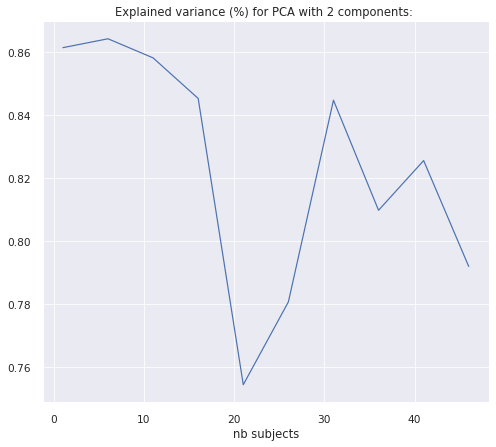

In [45]:
plt.plot(nb_subjects, [pca.explained_variance_ratio_.sum() for pca in pca_list])
plt.title('Explained variance (%) for PCA with 2 components: ')
plt.xlabel('nb subjects')

In [37]:
sleep_stages = get_sleep_stages(all_valid_set)
ages = get_ages(all_valid_set, info)
subjects = get_subjects(all_valid_set)

In [38]:
new_cmap = rand_cmap(max(subjects)+1, type='bright', first_color_black=True,
                     last_color_black=False, verbose=False)
mapping = {  # We merge stages 3 and 4 following AASM standards.
    'Sleep stage W': 0,
    'Sleep stage 1': 1,
    'Sleep stage 2': 2,
    'Sleep stage 3': 3,
    'Sleep stage 4': 3,
    'Sleep stage R': 4
}
reverse_mapping = {v: k[-1] for k,v in mapping.items()}

## Patient ID

100%|██████████| 10/10 [03:21<00:00, 20.16s/it]


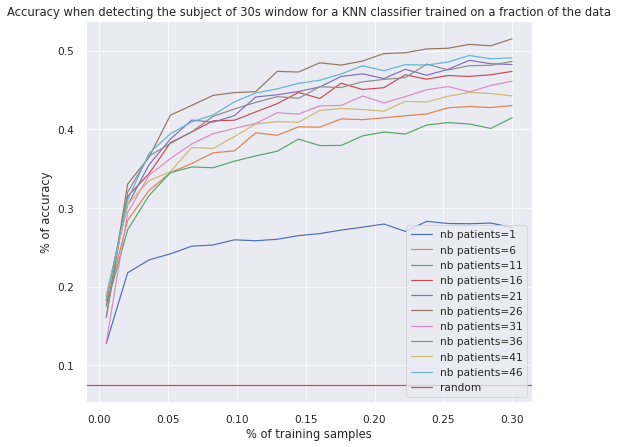

In [46]:
from utils.linear import plot_knn

plot_knn(embds_list, subjects, ['nb patients=' + str(nb) for nb in nb_subjects], verbose=1)
plt.title('Accuracy when detecting the subject of 30s window for a KNN classifier trained on a fraction of the data');

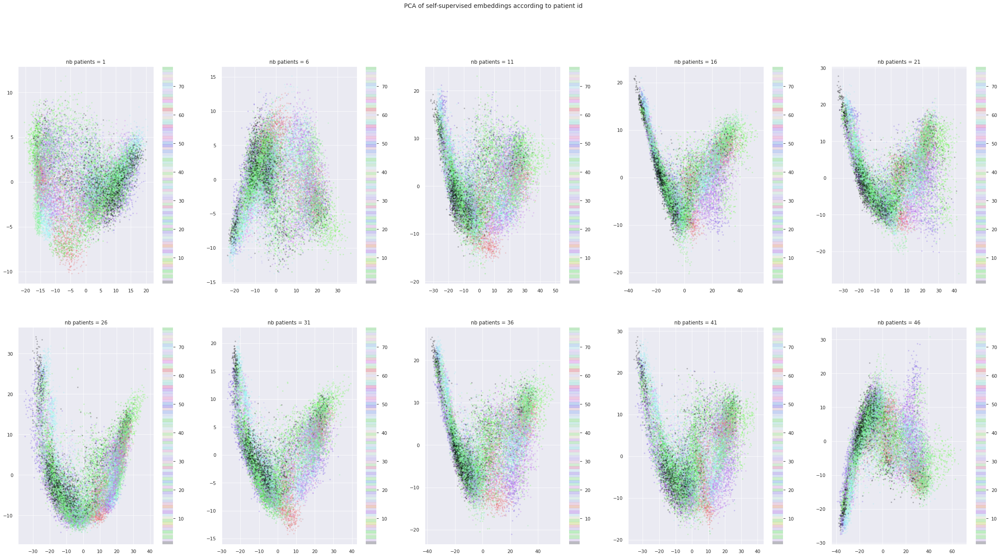

In [39]:
plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(pca_embds, subjects, new_cmap, alpha=0.2)
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.suptitle('PCA of self-supervised embeddings according to patient id');

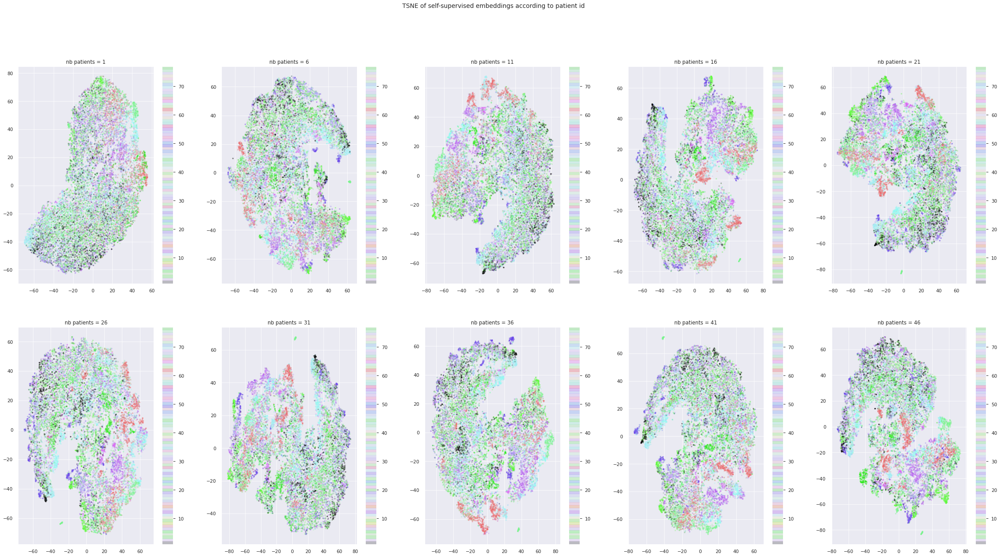

In [40]:
plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(tsne_embds, subjects, new_cmap, alpha=0.2)
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.suptitle('TSNE of self-supervised embeddings according to patient id');

## Sleep Stages

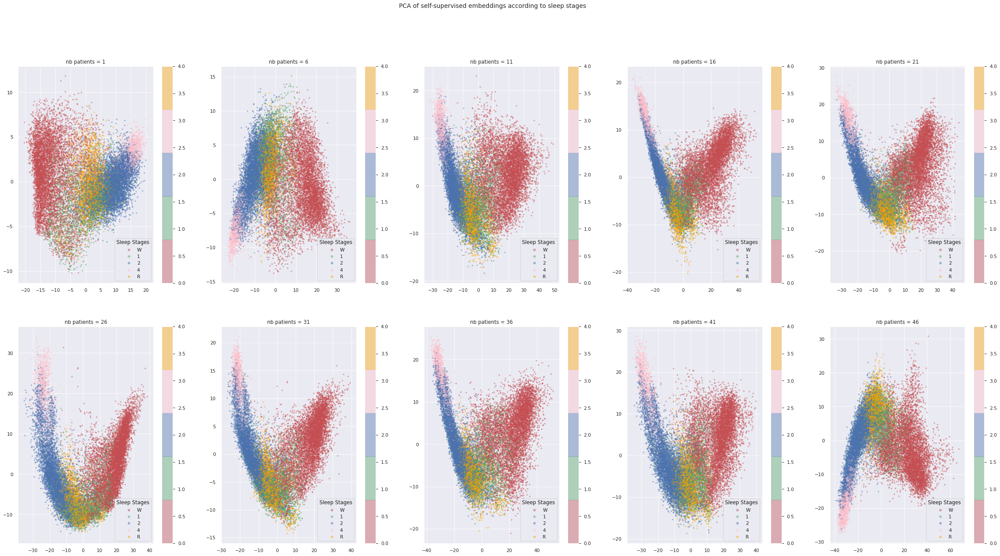

In [41]:
plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(pca_embds, sleep_stages, sleep_cmap, legend_dict={'title': 'Sleep Stages', 'color_mapping': reverse_mapping}, alpha=0.4)
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.suptitle("PCA of self-supervised embeddings according to sleep stages");

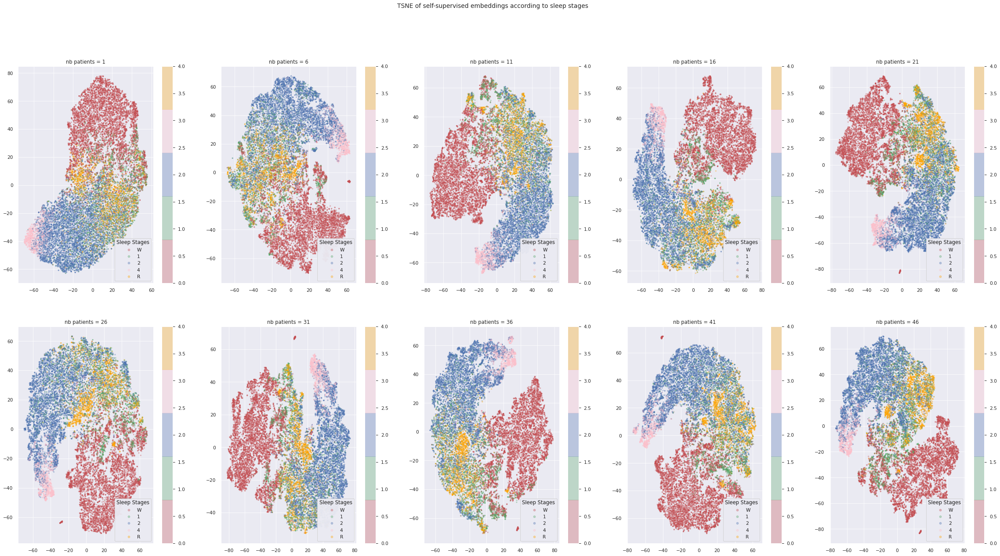

In [42]:
plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(tsne_embds, sleep_stages, sleep_cmap, legend_dict={'title': 'Sleep Stages', 'color_mapping': reverse_mapping})
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.suptitle("TSNE of self-supervised embeddings according to sleep stages");

100%|██████████| 10/10 [03:17<00:00, 19.72s/it]


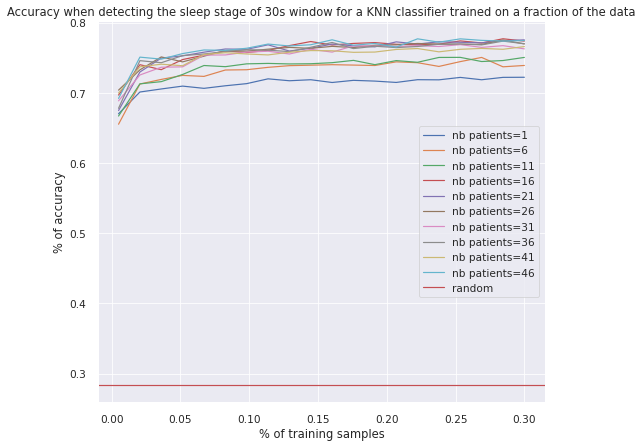

In [47]:
plot_knn(embds_list, sleep_stages, ['nb patients=' + str(nb) for nb in nb_subjects], verbose=1)
plt.title('Accuracy when detecting the sleep stage of 30s window for a KNN classifier trained on a fraction of the data');

## Age

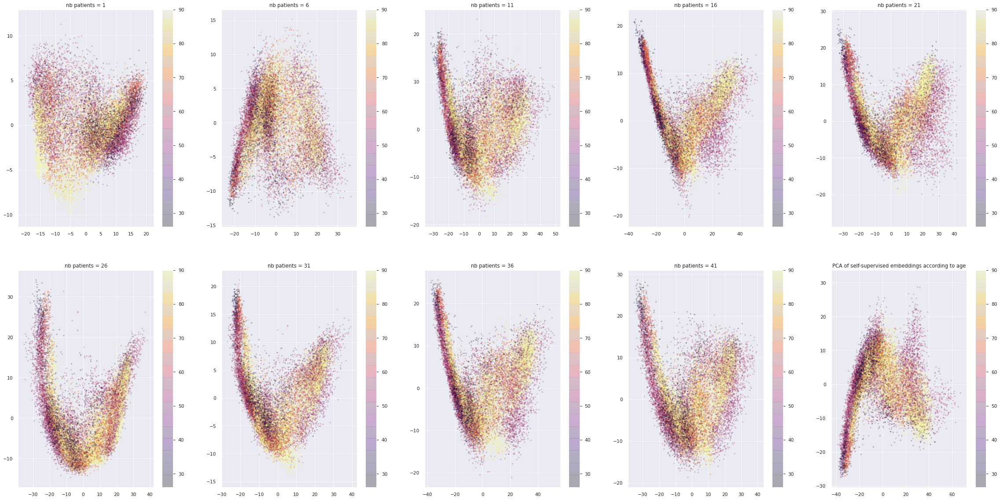

In [43]:
plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(pca_embds, ages, plt.get_cmap('inferno'), alpha=0.2)
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.title('PCA of self-supervised embeddings according to age');

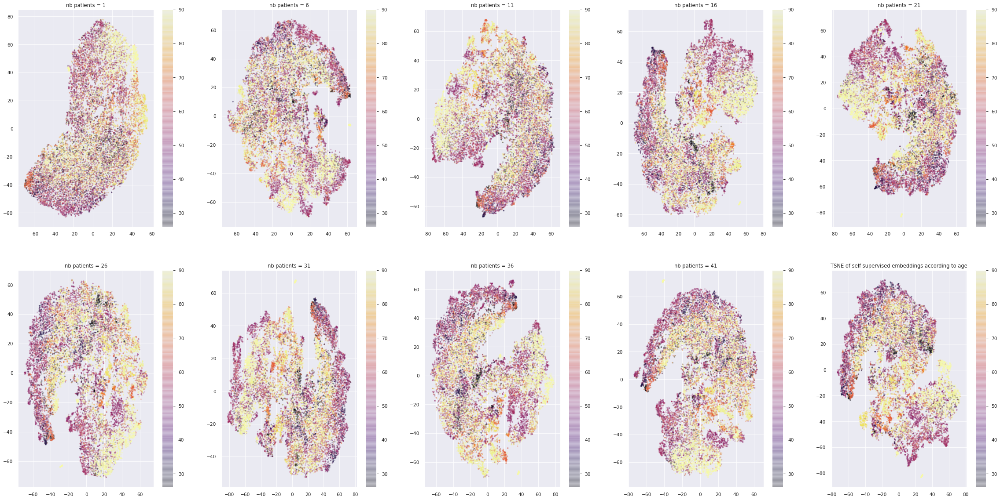

In [44]:
plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    plot_embeddings(tsne_embds, ages, plt.get_cmap('inferno'), alpha=0.2)
    plt.title("nb patients = {}".format(nb_subjects[i]))
plt.title('TSNE of self-supervised embeddings according to age');

# Downstream task

In [50]:
lr = 5e-4
batch_size = 16
max_nb_epochs = 40
early_stopping_patience = 5

acc_list = []
for network in networks:
    classifier_net = ClassifierNet(network.encoder, p_dropout=0.2)
    _, acc = train_and_test(classifier_net, full_train_set, valid_set, test_set=test_set, lr=lr, batch_size=batch_size,
                            max_nb_epochs=max_nb_epochs, early_stopping_patience=early_stopping_patience, train_what="last")
    acc_list.append(acc)

  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3682        1.3016       0.7038           0.4352        1.1997  18.4067


      2           0.3815        1.2956       0.7131           0.4589        1.1938  18.0996


      3           0.3843        1.2926       0.7231           0.5028        1.1920  18.5972


      4           0.3865        1.2909       0.7247           0.4923        1.1942  18.7814


      5           0.3905        1.2901       0.7215           0.4742        1.1870  19.3425


      6           0.3884        1.2895       0.7191           0.4547        1.1898  18.9144


      7           0.3895        1.2890       0.7262           0.4971        1.1812  19.1140


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3803        1.2905       0.6665           0.3990        1.2326  19.1195


      2           0.4038        1.2759       0.7222           0.5063        1.1930  19.3557


      3           0.4079        1.2714       0.6989           0.5212        1.2179  18.9569


      4           0.4135        1.2683       0.7124           0.5210        1.2036  19.8398


      5           0.4163        1.2655       0.7118           0.5172        1.2036  20.0073


      6           0.4184        1.2644       0.6941           0.5203        1.2158  19.1132


      7           0.4200        1.2625       0.7192           0.5133        1.1912  20.0375


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4583        1.2495       0.7315           0.4805        1.1708  20.0944


      2           0.4651        1.2458       0.7328           0.4841        1.1690  20.0756


      3           0.4690        1.2441       0.7248           0.4555        1.1762  19.5621


      4           0.4688        1.2431       0.7372           0.5019        1.1651  19.6543


      5           0.4780        1.2408       0.7506           0.5399        1.1498  19.7700


      6           0.4858        1.2377       0.7532           0.5485        1.1522  19.9673


      7           0.4881        1.2362       0.7572           0.5674        1.1446  20.0823


      8           0.4886        1.2350       0.7491           0.5431        1.1501  19.9897


      9           0.4902        1.2341       0.7474           0.5370        1.1554  19.7528


     10           0.4892        1.2341       0.7579           0.5603        1.1544  19.8570


     11           0.4921        1.2335       0.7487           0.5287        1.1497  19.7970


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4361        1.2430       0.7282           0.5165        1.1753  20.0371


      2           0.4519        1.2323       0.7202           0.5310        1.1856  20.2511


      3           0.4566        1.2282       0.7237           0.5255        1.1808  19.0467


      4           0.4610        1.2250       0.7023           0.5263        1.2016  20.2661


      5           0.4640        1.2227       0.7189           0.5334        1.1865  19.9955


      6           0.4681        1.2196       0.7057           0.5277        1.2007  20.6206


      7           0.4701        1.2181       0.7308           0.5324        1.1746  20.6318


      8           0.4721        1.2165       0.6979           0.5206        1.2042  20.3330


      9           0.4749        1.2155       0.7153           0.5338        1.1890  20.2858


     10           0.4758        1.2142       0.7078           0.5327        1.1966  20.0487


     11           0.4770        1.2136       0.7220           0.5377        1.1794  20.7399


     12           0.4784        1.2124       0.7082           0.5337        1.1971  20.4996


     13           0.4814        1.2119       0.7370           0.5362        1.1674  20.4266


     14           0.4814        1.2105       0.6639           0.5074        1.2354  20.2722


     15           0.4798        1.2116       0.7415           0.5480        1.1660  20.0404


     16           0.4801        1.2107       0.7179           0.5342        1.1837  20.5278


     17           0.4803        1.2109       0.7370           0.5419        1.1731  20.3806


     18           0.4822        1.2100       0.7212           0.5405        1.1853  20.4606


     19           0.4834        1.2090       0.7010           0.5304        1.1993  19.9086


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5383        1.2122       0.7424           0.6474        1.1625  19.9757


      2           0.5642        1.1985       0.7601           0.6336        1.1446  20.1048


      3           0.5658        1.1965       0.7616           0.6554        1.1419  20.1379


      4           0.5694        1.1932       0.7576           0.6499        1.1491  20.8932


      5           0.5726        1.1909       0.7389           0.6123        1.1626  19.7353


      6           0.5739        1.1892       0.7688           0.6603        1.1333  20.3548


      7           0.5766        1.1887       0.7461           0.6457        1.1574  19.9832


      8           0.5807        1.1870       0.7716           0.6767        1.1393  19.9506


      9           0.5836        1.1842       0.7557           0.6598        1.1485  20.8915


     10           0.5809        1.1851       0.7593           0.6788        1.1465  20.1745


     11           0.5833        1.1836       0.7768           0.6549        1.1246  20.6668


     12           0.5871        1.1827       0.7700           0.6727        1.1347  20.9062


     13           0.5887        1.1814       0.7552           0.6345        1.1476  20.0281


     14           0.5895        1.1805       0.7740           0.6670        1.1326  20.8428


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5498        1.2014       0.7747           0.6333        1.1310  20.1990


      2           0.5815        1.1860       0.7620           0.6377        1.1391  20.4252


      3           0.5892        1.1814       0.7626           0.6671        1.1391  20.4161


      4           0.5929        1.1779       0.7518           0.6074        1.1488  20.2973


      5           0.5906        1.1772       0.7515           0.6602        1.1482  20.6969


      6           0.5908        1.1754       0.7539           0.6455        1.1507  20.2994


      7           0.5925        1.1746       0.7383           0.6336        1.1666  20.1198


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5214        1.2239       0.7511           0.6173        1.1592  20.1561


      2           0.5483        1.2094       0.7587           0.6121        1.1449  20.4693


      3           0.5604        1.2022       0.7298           0.6245        1.1778  20.5244


      4           0.5648        1.1968       0.7406           0.6405        1.1617  20.7201


      5           0.5701        1.1947       0.7647           0.6477        1.1442  19.9619


      6           0.5701        1.1912       0.7536           0.6293        1.1563  20.4214


      7           0.5755        1.1908       0.7252           0.6545        1.1777  20.4720


      8           0.5802        1.1885       0.7626           0.6614        1.1406  19.7435


      9           0.5779        1.1884       0.7690           0.6609        1.1374  20.1772


     10           0.5820        1.1868       0.7541           0.6546        1.1545  20.4111


     11           0.5801        1.1862       0.7622           0.6556        1.1425  21.1145


     12           0.5824        1.1855       0.7499           0.6523        1.1534  20.6037


     13           0.5830        1.1847       0.7687           0.6651        1.1384  20.3102


     14           0.5836        1.1838       0.7541           0.6549        1.1514  19.5944


     15           0.5827        1.1835       0.7192           0.6288        1.1891  19.5962


     16           0.5890        1.1829       0.7825           0.6788        1.1347  20.1148


     17           0.5869        1.1819       0.7580           0.6654        1.1450  20.7332


     18           0.5882        1.1827       0.7615           0.6541        1.1426  20.4330


     19           0.5898        1.1802       0.7724           0.6918        1.1395  20.8942


     20           0.5911        1.1797       0.7632           0.6988        1.1624  20.8558


     21           0.5852        1.1817       0.7760           0.6358        1.1260  20.7937


     22           0.5921        1.1799       0.7722           0.6584        1.1410  20.1502


     23           0.5893        1.1802       0.7315           0.6605        1.1766  20.7043


     24           0.5901        1.1793       0.7647           0.6569        1.1426  20.2277


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4795        1.2405       0.7382           0.4904        1.1560  20.2002


      2           0.5583        1.1981       0.7215           0.6459        1.1831  20.4143


      3           0.5659        1.1913       0.7675           0.6299        1.1443  20.4089


      4           0.5715        1.1870       0.7645           0.6147        1.1462  20.0836


      5           0.5800        1.1822       0.7403           0.6170        1.1653  20.7122


      6           0.5745        1.1825       0.7356           0.6160        1.1684  20.5083


      7           0.5814        1.1810       0.7788           0.6604        1.1391  20.0940


      8           0.5867        1.1776       0.7617           0.6597        1.1452  20.8317


      9           0.5916        1.1750       0.7599           0.6797        1.1477  20.5684


     10           0.5916        1.1747       0.7392           0.6071        1.1611  20.4951


     11           0.5914        1.1738       0.7578           0.6169        1.1491  20.2894


     12           0.5927        1.1734       0.7663           0.6475        1.1385  20.7562


     13           0.5919        1.1727       0.7697           0.6283        1.1338  20.3965


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3920        1.2710       0.7193           0.5064        1.1903  20.0364


      2           0.4520        1.2324       0.7212           0.5222        1.1860  20.3980


      3           0.4585        1.2288       0.7270           0.5126        1.1761  19.4520


      4           0.4606        1.2273       0.7308           0.4963        1.1717  19.9344


      5           0.4648        1.2253       0.7489           0.5417        1.1626  19.5377


      6           0.4630        1.2238       0.7084           0.4829        1.1938  19.1981


      7           0.4641        1.2239       0.7099           0.4807        1.1886  18.9809


      8           0.4651        1.2233       0.7332           0.5196        1.1745  19.8122


      9           0.4678        1.2224       0.7377           0.5085        1.1649  19.4800


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4547        1.2273       0.7201           0.5325        1.1827  19.2959


      2           0.4770        1.2150       0.7322           0.5232        1.1693  18.9166


      3           0.4802        1.2127       0.7246           0.5418        1.1752  19.2265


      4           0.4863        1.2076       0.6836           0.5091        1.2155  18.9449


      5           0.4860        1.2068       0.6639           0.5026        1.2306  18.9794


      6           0.5214        1.1981       0.7366           0.5925        1.1600  19.2453


      7           0.5883        1.1788       0.7566           0.6665        1.1450  19.0570


      8           0.5932        1.1749       0.7517           0.6543        1.1471  18.5821


      9           0.6002        1.1730       0.7304           0.6123        1.1672  18.4732


     10           0.5943        1.1737       0.7660           0.6532        1.1357  18.9281


     11           0.5966        1.1726       0.7498           0.6735        1.1465  19.5727


     12           0.5996        1.1719       0.7570           0.6783        1.1451  19.1261


     13           0.6031        1.1701       0.7408           0.6546        1.1578  18.4634


     14           0.6062        1.1702       0.7759           0.6644        1.1261  18.8622


     15           0.6010        1.1717       0.7899           0.7096        1.1207  18.8839


     16           0.6079        1.1689       0.7937           0.6845        1.1149  19.1472


     17           0.6081        1.1691       0.7769           0.6694        1.1306  19.1782


     18           0.6035        1.1696       0.7855           0.6737        1.1224  19.1658


     19           0.6069        1.1689       0.7764           0.6744        1.1266  19.4724


Stopping since valid_bal_acc has not improved in the last 5 epochs.


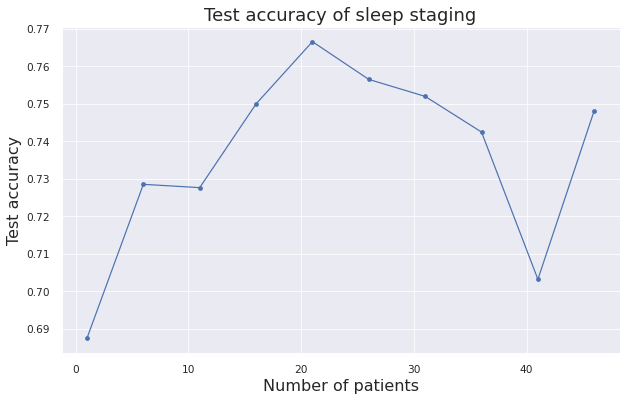

In [59]:
plt.figure(figsize=(10,6));
plt.plot(nb_subjects, acc_list, marker="o");
plt.xlabel("Number of patients", fontsize=16);
plt.ylabel("Test accuracy", fontsize=16);
plt.title("Test accuracy of sleep staging", fontsize=18);

In [62]:
acc

0.7050956118050182